<a href="https://colab.research.google.com/github/DDreher/vanilla_gan_pytorch/blob/main/vanilla_gan_pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PyTorch implementation of a vanilla GAN

In this notebook a vanilla generative adversarial network (GAN) is implemented with the PyTorch library.
The GAN will be trained to generate hand-written images of digits based on the [MNIST](http://yann.lecun.com/exdb/mnist/) data set.

## Utility Functions

In [1]:
import matplotlib.pyplot as plt

import torch
from torch import nn
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
from torchvision.datasets import MNIST
from tqdm.auto import tqdm
torch.manual_seed(0)

def plot_images_from_tensor(image_tensor, num_images=25, image_dim=(1, 28, 28)):
    """
    Plots images contained in a tensor in a grid.

    :param image_tensor: Flattened tensor containing the images
    :param num_images: The number of images contained in the tensor
    :param image_dim: The dimensions of a single image
    """
    images = image_tensor.detach().cpu().view(-1, *image_dim)
    images_grid = make_grid(images[:num_images], nrow=5)
    plt.imshow(images_grid.permute(1, 2, 0).squeeze())
    plt.show()

## Generator

In [2]:
def create_generator_block(input_dim, output_dim):
    """
    Assembles a block consisting of linear layer, batchnorm and a final ReLU activation function.
    :param input_dim: dimension of the input feature vector (scalar)
    :param output_dim: dimension of the output feature vector (scalar)
    :return: a nn.Sequential object containing the block elements.
    """
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
    )

In [3]:
class Generator(nn.Module):

    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        """
        Constructs an object of the Generator class.

        :param z_dim: dimension of the noise vector
        :param im_dim: dimension of the flattened image tensor
        :param hidden_dim: dimension of the first hidden layer tensor
        """
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            create_generator_block(z_dim, hidden_dim),
            create_generator_block(hidden_dim, hidden_dim * 2),
            create_generator_block(hidden_dim * 2, hidden_dim * 4),
            create_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid(),
        )

    def forward(self, noise):
        return self.gen(noise)
    
    def get_model(self):
        return self.gen

In [4]:
def create_noise(n_samples, z_dim, device='cpu'):
    """
    Creates a pytorch tensor with noise sampled from a normal distribution.

    :param n_samples: number of samples to generate, scalar
    :param z_dim: dimension of each noise sample, scalar
    :param device: device type ('cpu' or 'cuda')
    :return: a pytorch tensor with noise
    """
    return torch.randn(size=[n_samples, z_dim], device=device)

## Discriminator

In [5]:
def create_discriminator_block(input_dim, output_dim):
    """
    Assembles a block consisting of linear layer, a final LeakyReLU activation function.
    :param input_dim: dimension of the input feature vector (scalar)
    :param output_dim: dimension of the output feature vector (scalar)
    :return: a nn.Sequential object containing the block elements.
    """
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(negative_slope=0.2)
    )

In [6]:
class Discriminator(nn.Module):
    def __init__(self, im_dim=784, hidden_dim=128):
        """
        Construct a discriminator PyTorch model
        :param im_dim: dimension of the flattened image tensor, scalar
        :param hidden_dim: dimension of the first hidden layer, scalar
        """
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
        create_discriminator_block(im_dim, hidden_dim * 4),
        create_discriminator_block(hidden_dim * 4, hidden_dim * 2),
        create_discriminator_block(hidden_dim * 2, hidden_dim),
        nn.Linear(hidden_dim, 1),
        )

    def forward(self, image):
        return self.disc(image)
    
    def get_model(self):
        return self.disc

## Training

In [7]:
# Hyperparameters
loss_function = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'

# dataset
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw
Processing...
Done!


/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:469: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [8]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [9]:
def get_disc_loss(gen, disc, loss_function, real, batch_size, z_dim, device):
    """
    Calculate the discriminator's loss with given input values.

    :param gen: generator model
    :param disc: discriminator model
    :param loss_function: the employed loss function
    :param real: batch of real images, tensor
    :param batch_size: the number of images in the batch
    :param z_dim: dimension of the noise vector
    :param device: pytorch device ('CPU' or 'CUDA')
    :return: The loss of the discriminator, torch scalar
    """
    noise = create_noise(batch_size, z_dim, device)
    fakes = gen(noise).detach()
    y_pred_fake = disc(fakes)
    loss_fakes = loss_function(y_pred_fake, torch.zeros_like(y_pred_fake))
    y_pred_real = disc(real)
    loss_real = loss_function(y_pred_real, torch.ones_like(y_pred_real))
    disc_loss = (loss_fakes+loss_real)*.5
    return disc_loss

In [10]:
def get_gen_loss(gen, disc, loss_function, batch_size, z_dim, device):
    """
    Calculate the generator's loss with given input values.

    :param gen: generator model
    :param disc: discriminator model
    :param loss_function: the employed loss function
    :param batch_size: the number of images in the batch
    :param z_dim: dimension of the noise vector
    :param device: pytorch device ('CPU' or 'CUDA')
    :return: The loss of the generator, torch scalar
    """
    noise = create_noise(batch_size, z_dim, device)
    fakes = gen(noise)
    y_pred_fake = disc(fakes)
    gen_loss = loss_function(y_pred_fake, torch.ones_like(y_pred_fake))
    return gen_loss

Step 500: Generator loss: 1.386800330758095, discriminator loss: 0.41925629138946546


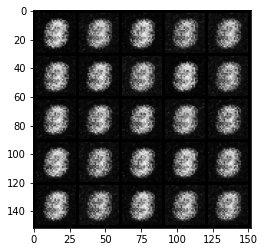

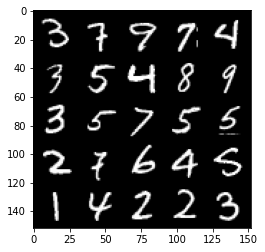

Step 1000: Generator loss: 1.6644974958896646, discriminator loss: 0.3024815676510336


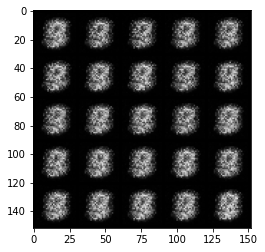

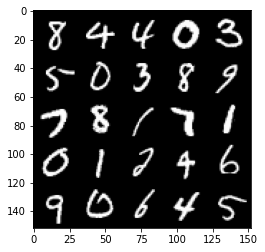

Step 1500: Generator loss: 1.956848928689956, discriminator loss: 0.17544189375638958


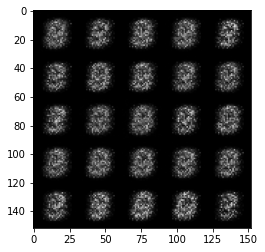

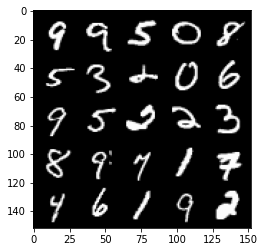

Step 2000: Generator loss: 1.7484094591140744, discriminator loss: 0.20056353607773775


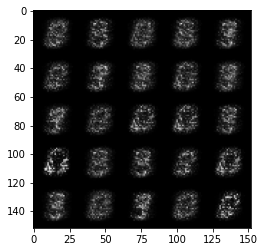

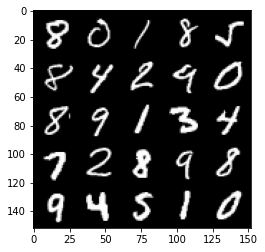

Step 2500: Generator loss: 1.7230945909023279, discriminator loss: 0.19578820076584807


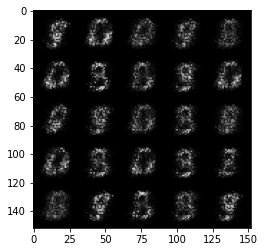

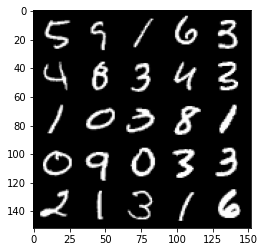

Step 3000: Generator loss: 2.0090946834087355, discriminator loss: 0.15641844743490224


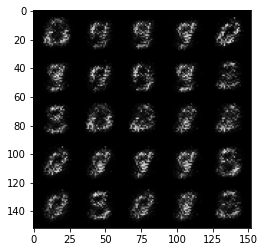

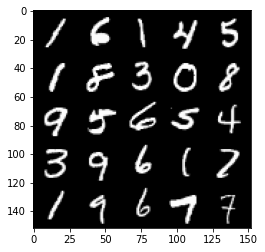

Step 3500: Generator loss: 2.3850988121032692, discriminator loss: 0.12759397719800467


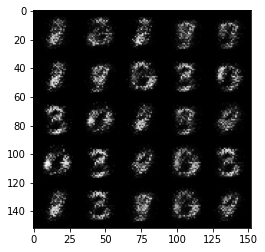

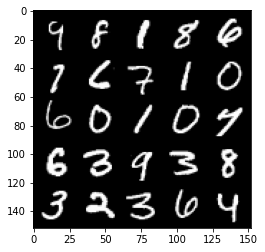

Step 4000: Generator loss: 2.7452365598678585, discriminator loss: 0.10922408424317841


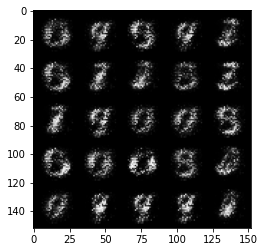

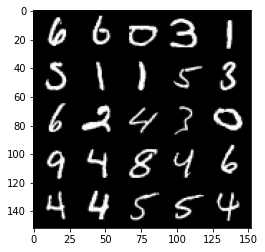

Step 4500: Generator loss: 3.1694796872138955, discriminator loss: 0.09709217050671579


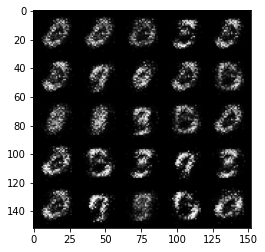

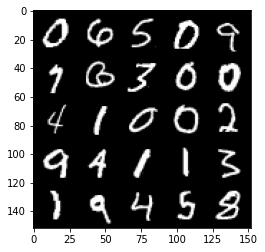

Step 5000: Generator loss: 3.341667600154875, discriminator loss: 0.08285287947207697


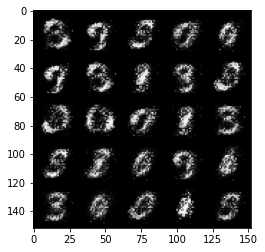

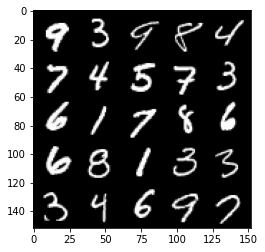

Step 5500: Generator loss: 3.6856069312095623, discriminator loss: 0.08049537706375122


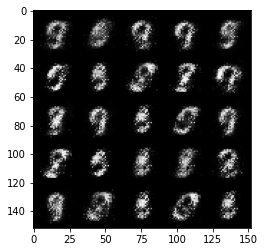

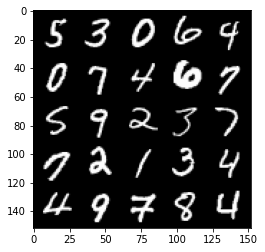

Step 6000: Generator loss: 3.5557056984901427, discriminator loss: 0.07959579109400511


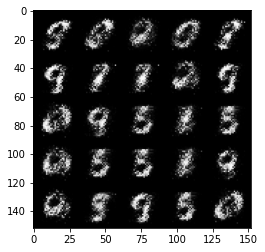

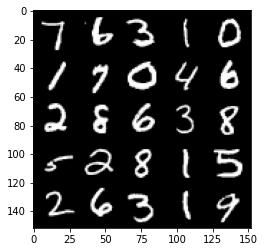

Step 6500: Generator loss: 3.834395087718966, discriminator loss: 0.06040678938478227


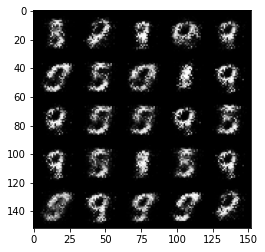

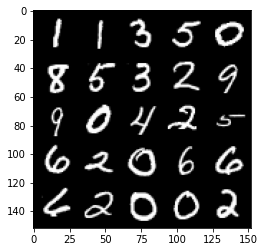

Step 7000: Generator loss: 4.081688867568969, discriminator loss: 0.04884936697408559


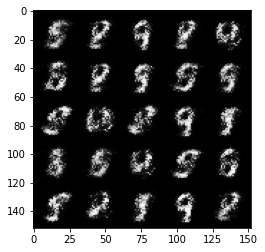

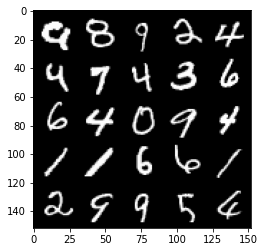

Step 7500: Generator loss: 4.111853971481325, discriminator loss: 0.04827338074147702


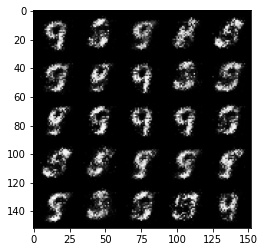

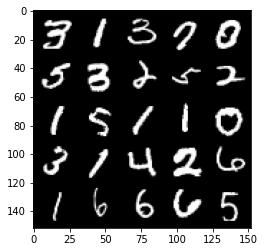

Step 8000: Generator loss: 3.9824054698944114, discriminator loss: 0.058484605476260165


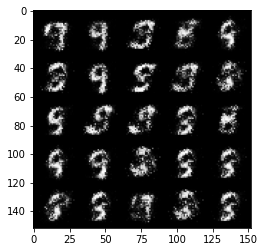

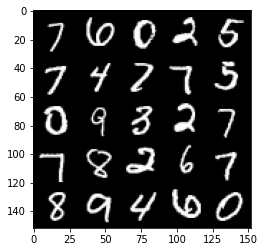

Step 8500: Generator loss: 4.393632556915282, discriminator loss: 0.05208659832552075


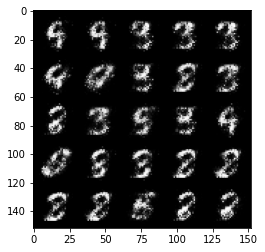

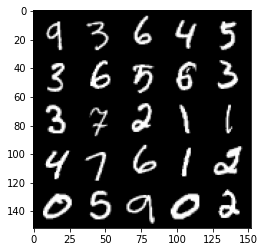

Step 9000: Generator loss: 4.1599383368492155, discriminator loss: 0.055079284705221665


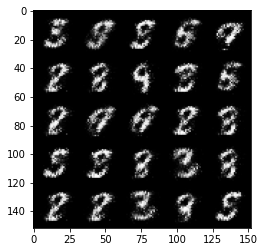

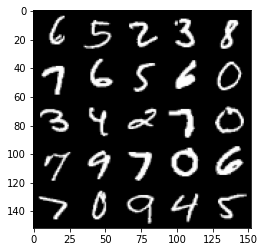

Step 9500: Generator loss: 4.199991777420049, discriminator loss: 0.050197336036711934


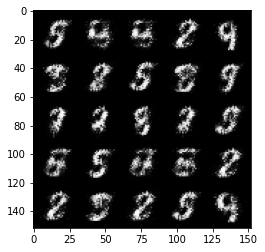

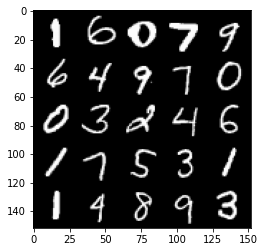

Step 10000: Generator loss: 4.044685244083403, discriminator loss: 0.06299742540717126


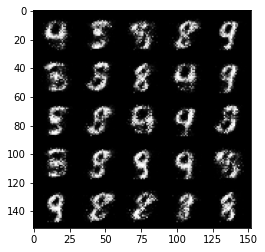

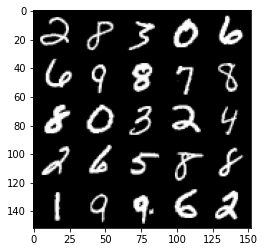

Step 10500: Generator loss: 4.038526844978332, discriminator loss: 0.06976272964105008


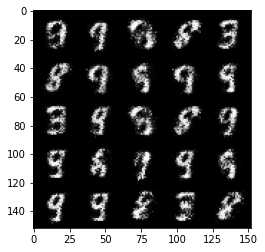

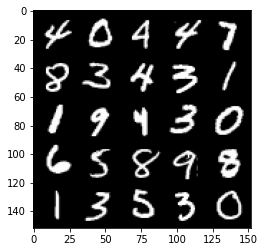

Step 11000: Generator loss: 4.0250424242019625, discriminator loss: 0.06885831606388088


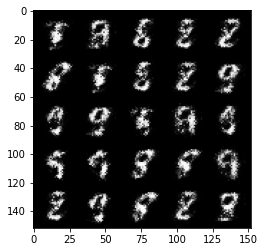

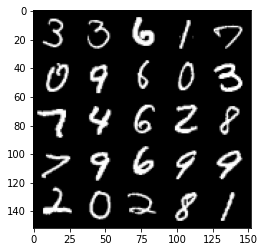

Step 11500: Generator loss: 4.170749472141264, discriminator loss: 0.06278623721003533


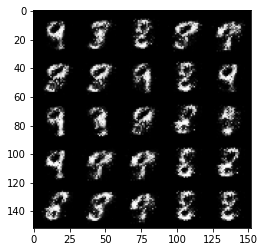

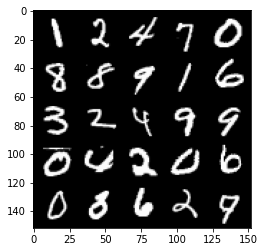

Step 12000: Generator loss: 4.048297758102414, discriminator loss: 0.0756722626499831


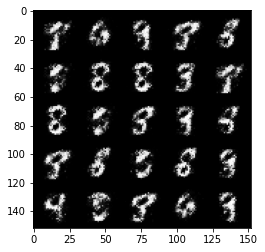

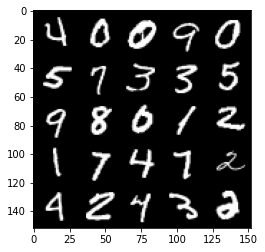

Step 12500: Generator loss: 3.9581732273101786, discriminator loss: 0.07748095951229333


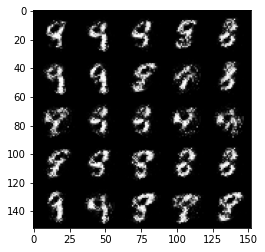

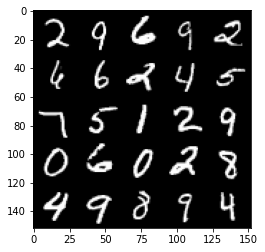

Step 13000: Generator loss: 4.128050125598911, discriminator loss: 0.07210972785577176


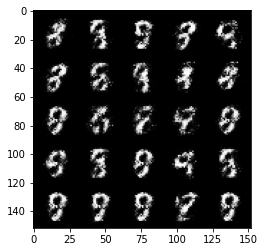

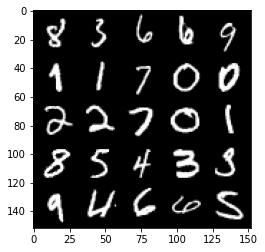

Step 13500: Generator loss: 3.932523202896121, discriminator loss: 0.0824944095052778


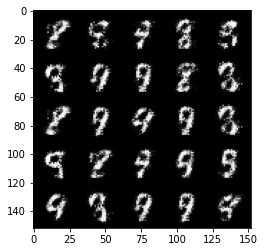

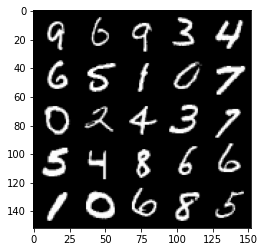

Step 14000: Generator loss: 3.771488222599029, discriminator loss: 0.09318891754001372


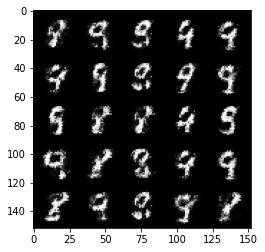

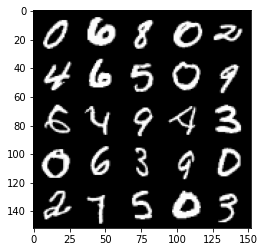

Step 14500: Generator loss: 3.8788943481445277, discriminator loss: 0.10222366756200789


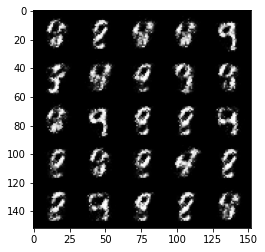

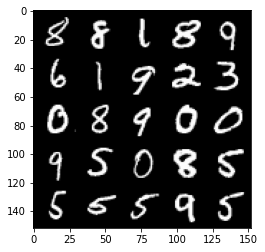

Step 15000: Generator loss: 3.6040559015274094, discriminator loss: 0.11403315620124338


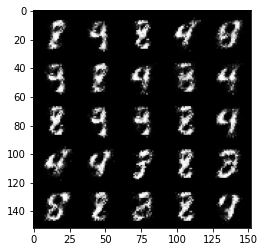

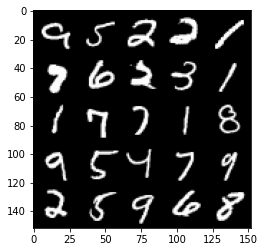

Step 15500: Generator loss: 3.7646242780685415, discriminator loss: 0.09973128591477871


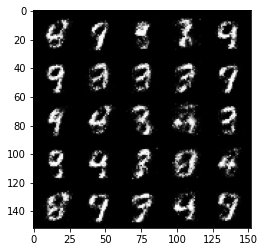

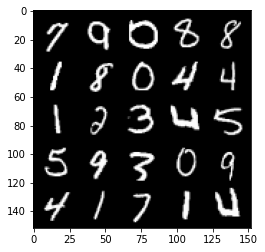

Step 16000: Generator loss: 3.7513183860778816, discriminator loss: 0.09595202221721404


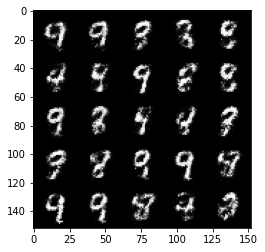

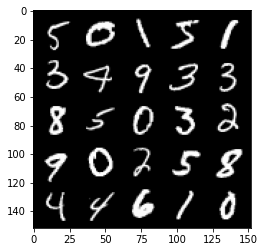

Step 16500: Generator loss: 3.6206529173851036, discriminator loss: 0.11599687702953815


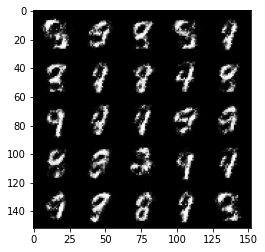

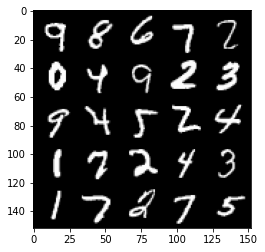

Step 17000: Generator loss: 3.6094960532188427, discriminator loss: 0.12651721308380373


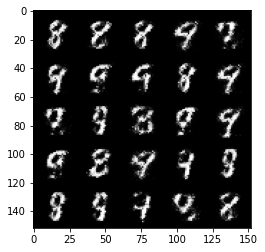

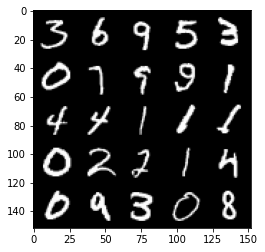

Step 17500: Generator loss: 3.5143081274032566, discriminator loss: 0.12008807196468123


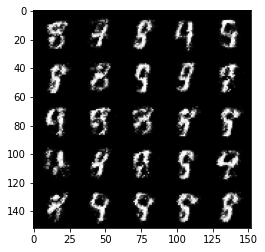

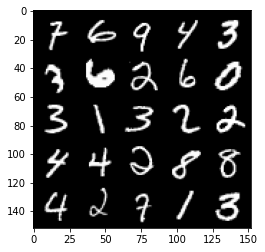

Step 18000: Generator loss: 3.6332058348655707, discriminator loss: 0.10650211621820911


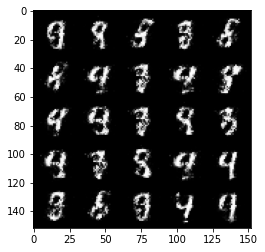

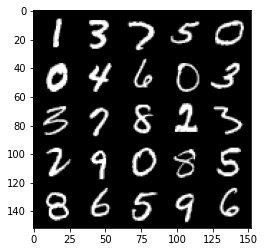

Step 18500: Generator loss: 3.5155377464294433, discriminator loss: 0.13574776951968684


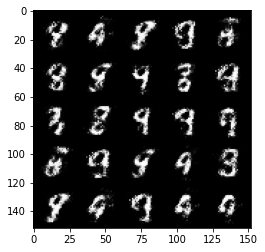

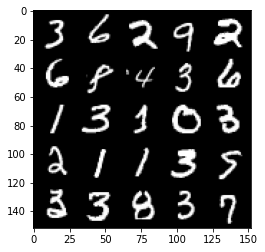

Step 19000: Generator loss: 3.538202348709107, discriminator loss: 0.12020694623142489


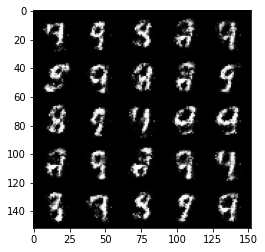

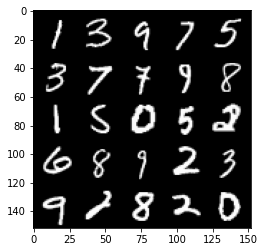

Step 19500: Generator loss: 3.4637499437332155, discriminator loss: 0.13661025865376


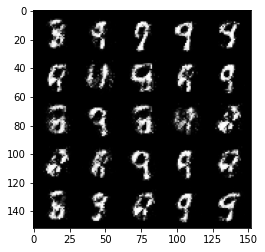

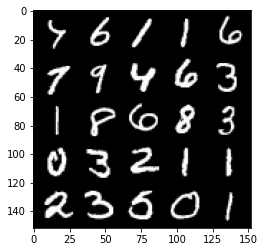

Step 20000: Generator loss: 3.315622966766358, discriminator loss: 0.15423065096139899


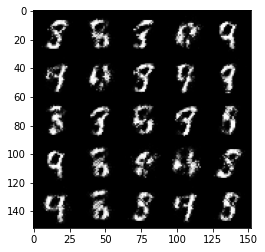

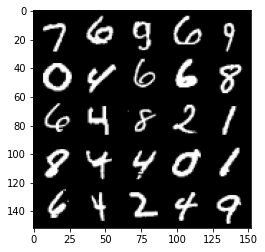

Step 20500: Generator loss: 3.302248794078827, discriminator loss: 0.15044695895910273


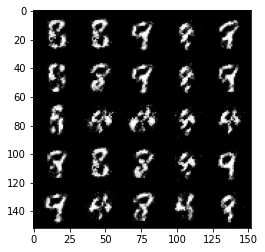

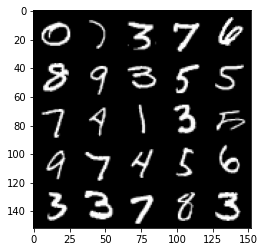

Step 21000: Generator loss: 3.4325838308334333, discriminator loss: 0.13442387340217832


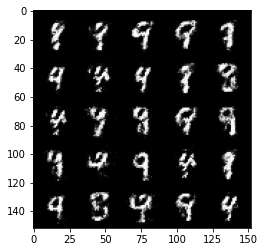

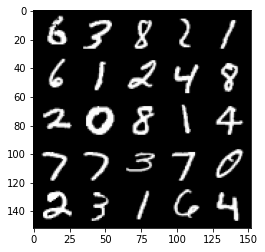

Step 21500: Generator loss: 3.213421772003173, discriminator loss: 0.16387120915949344


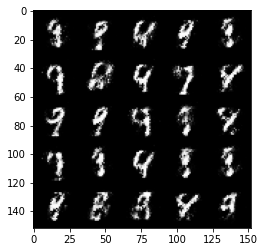

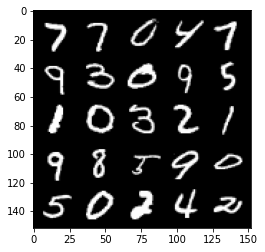

Step 22000: Generator loss: 3.1508440666198703, discriminator loss: 0.16643690913915643


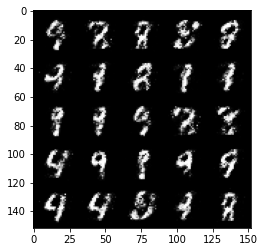

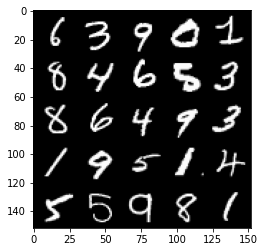

Step 22500: Generator loss: 3.1013813481330863, discriminator loss: 0.18194963006675238


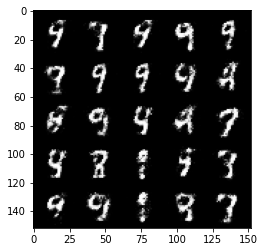

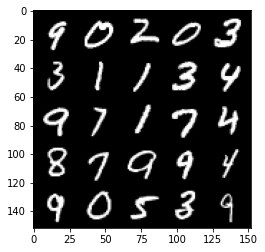

Step 23000: Generator loss: 3.1439287052154525, discriminator loss: 0.17227200540900228


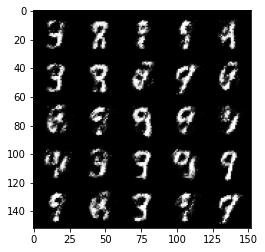

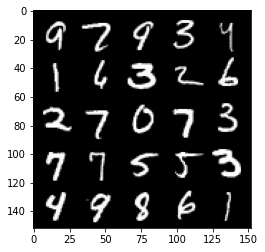

Step 23500: Generator loss: 3.2005880632400516, discriminator loss: 0.1683521731644871


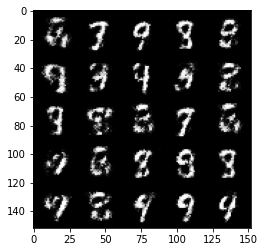

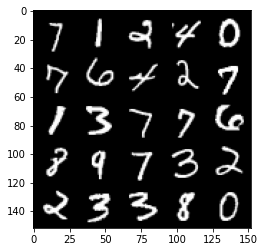

Step 24000: Generator loss: 3.0255877070426958, discriminator loss: 0.1863658654093742


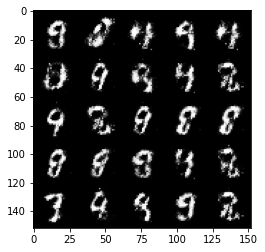

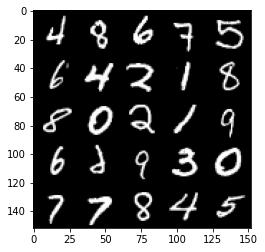

Step 24500: Generator loss: 3.071290611743928, discriminator loss: 0.16698395006358605


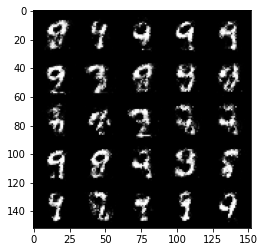

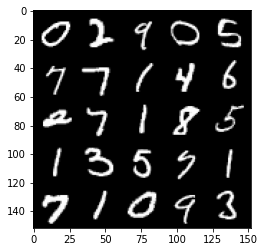

Step 25000: Generator loss: 3.2393690381050133, discriminator loss: 0.16074956157803533


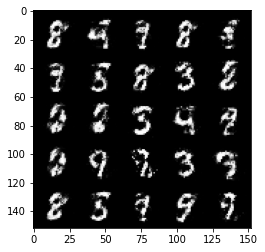

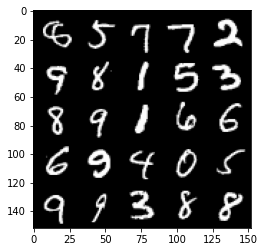

Step 25500: Generator loss: 3.149807379245761, discriminator loss: 0.16015114367008207


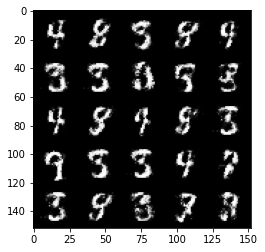

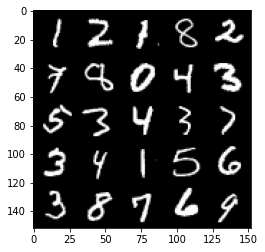

Step 26000: Generator loss: 3.040540819168088, discriminator loss: 0.1708795863240957


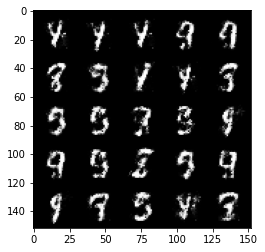

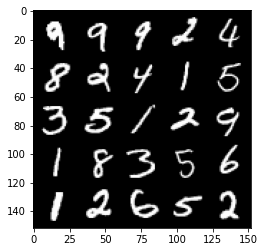

Step 26500: Generator loss: 3.0903388519287116, discriminator loss: 0.1860462856888769


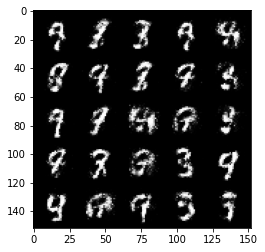

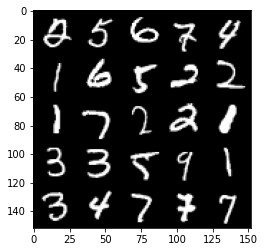

Step 27000: Generator loss: 2.78065220451355, discriminator loss: 0.22242699861526485


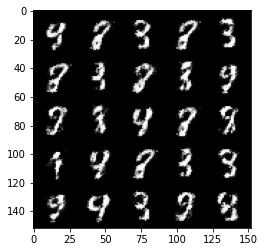

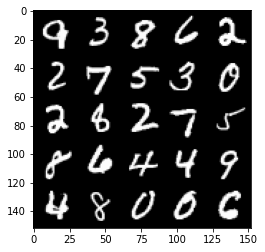

Step 27500: Generator loss: 2.9018556642532363, discriminator loss: 0.2023450077176095


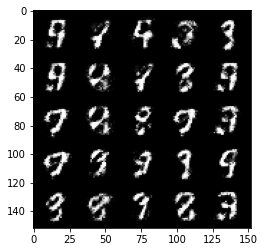

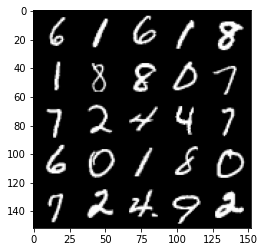

Step 28000: Generator loss: 2.848571770668031, discriminator loss: 0.20849109974503527


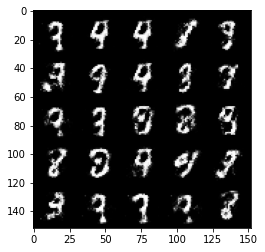

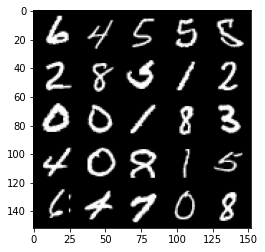

Step 28500: Generator loss: 2.8524494681358328, discriminator loss: 0.18724468888342377


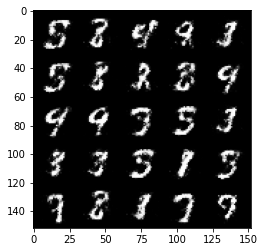

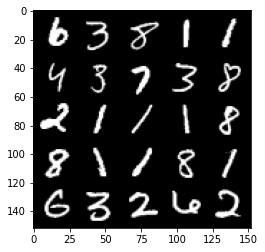

Step 29000: Generator loss: 2.888191802024843, discriminator loss: 0.2119903029203415


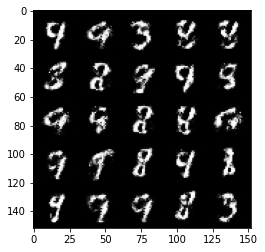

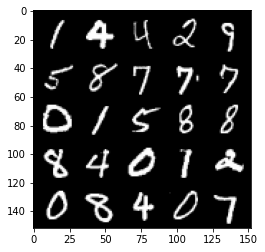

Step 29500: Generator loss: 2.8033037676811214, discriminator loss: 0.2148561023920775


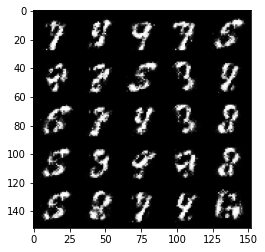

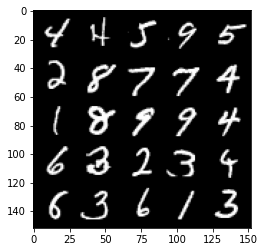

Step 30000: Generator loss: 2.853460029125215, discriminator loss: 0.20279038247466102


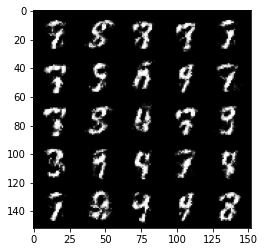

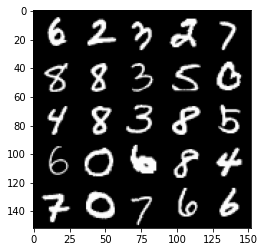

Step 30500: Generator loss: 2.7525089077949554, discriminator loss: 0.22371553939580932


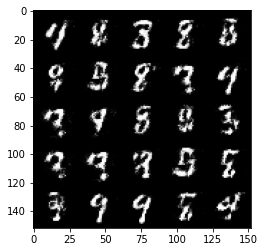

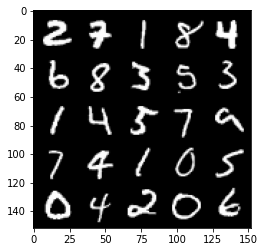

Step 31000: Generator loss: 2.7385987801551797, discriminator loss: 0.21096091872453682


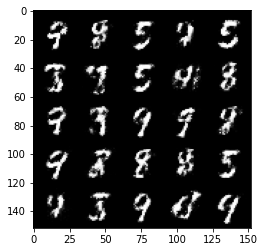

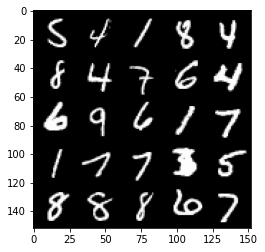

Step 31500: Generator loss: 2.744344115257263, discriminator loss: 0.22092843995988382


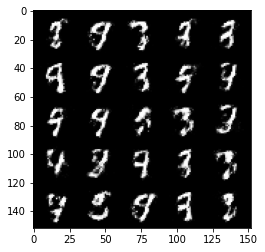

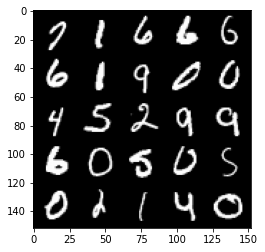

Step 32000: Generator loss: 2.5820458719730404, discriminator loss: 0.25187017837166786


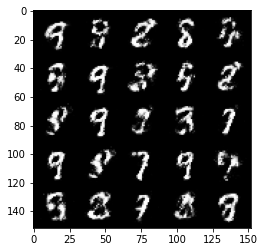

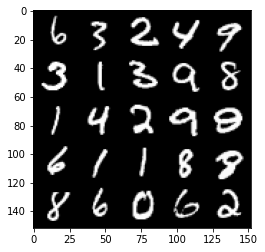

Step 32500: Generator loss: 2.551576223373416, discriminator loss: 0.25447958534955956


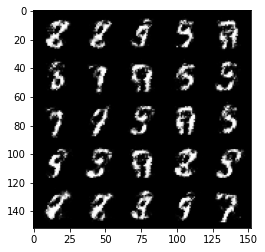

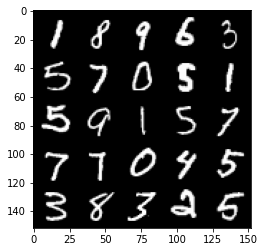

Step 33000: Generator loss: 2.4957850353717834, discriminator loss: 0.23931011053919793


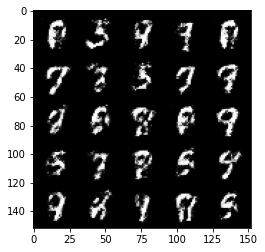

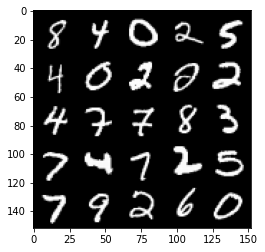

Step 33500: Generator loss: 2.528844609975818, discriminator loss: 0.25710616007447223


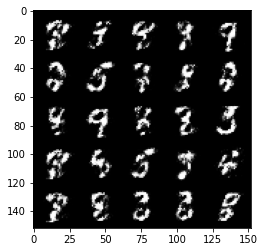

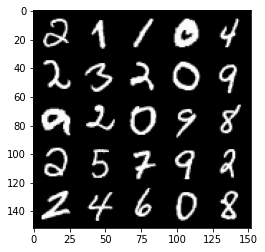

Step 34000: Generator loss: 2.4861774978637707, discriminator loss: 0.2529452195763588


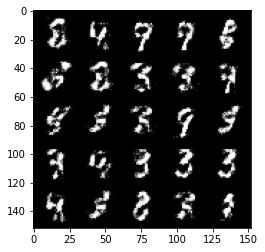

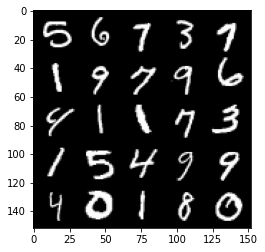

Step 34500: Generator loss: 2.5337426815032966, discriminator loss: 0.23833418574929235


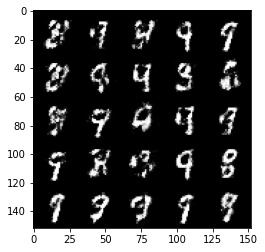

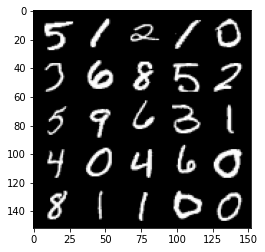

Step 35000: Generator loss: 2.6036013178825375, discriminator loss: 0.2337243683636192


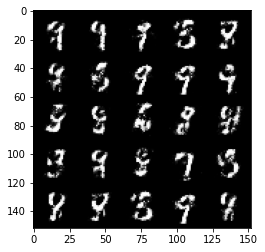

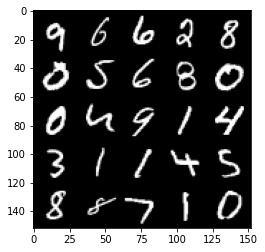

Step 35500: Generator loss: 2.531526201725009, discriminator loss: 0.25250575140118603


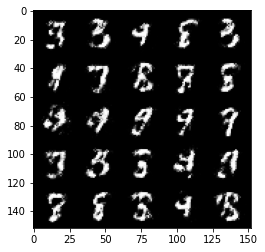

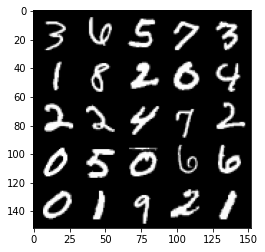

Step 36000: Generator loss: 2.5517041158676146, discriminator loss: 0.22590323269367227


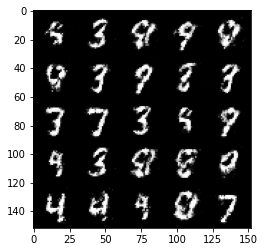

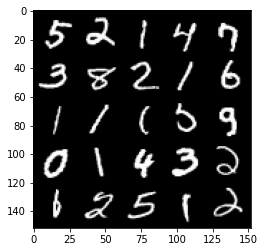

Step 36500: Generator loss: 2.5300628082752232, discriminator loss: 0.2532386957705022


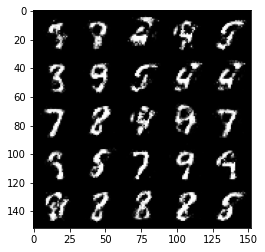

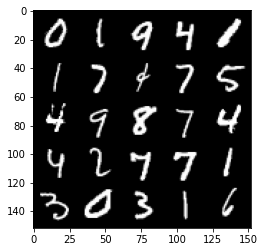

Step 37000: Generator loss: 2.394475957870482, discriminator loss: 0.2613390957117081


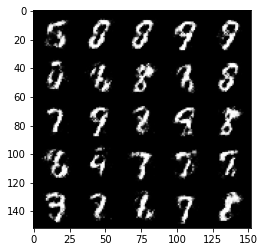

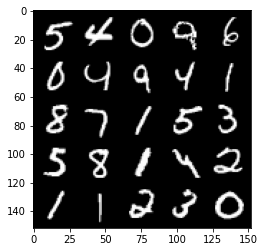

Step 37500: Generator loss: 2.372707531690597, discriminator loss: 0.26339815190434435


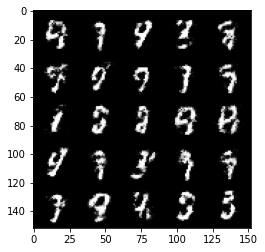

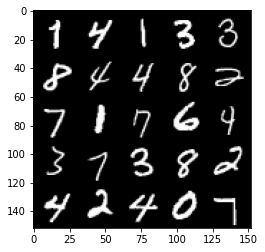

Step 38000: Generator loss: 2.3257250528335542, discriminator loss: 0.26514649939537055


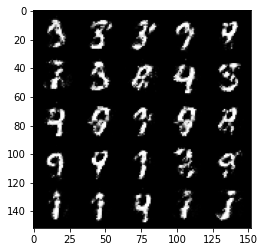

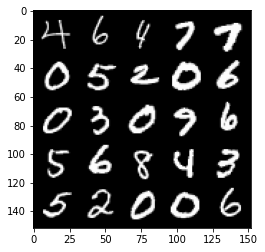

Step 38500: Generator loss: 2.3124193639755277, discriminator loss: 0.2778480449318886


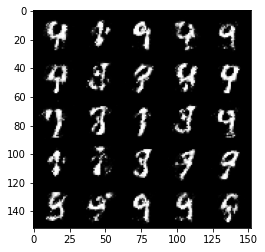

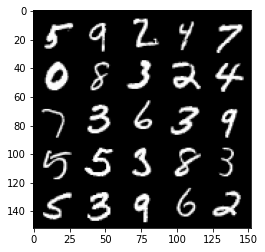

Step 39000: Generator loss: 2.314991006612778, discriminator loss: 0.26801236796379097


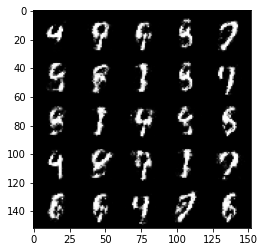

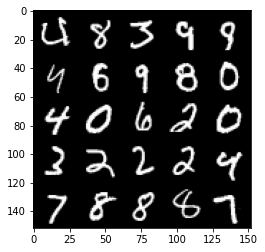

Step 39500: Generator loss: 2.3060384185314184, discriminator loss: 0.28180372214317295


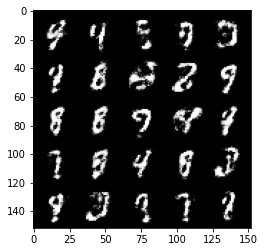

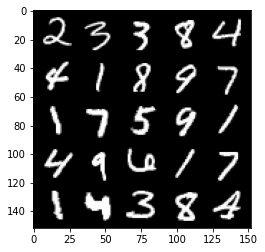

Step 40000: Generator loss: 2.3169865078926075, discriminator loss: 0.27093003007769584


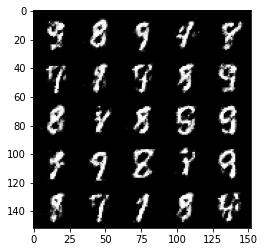

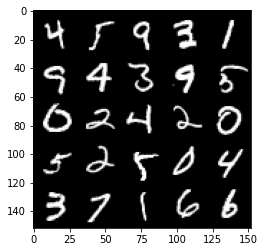

Step 40500: Generator loss: 2.2763494229316725, discriminator loss: 0.27835456028580663


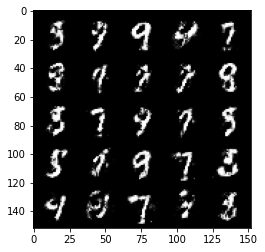

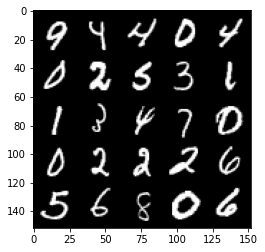

Step 41000: Generator loss: 2.2133506481647487, discriminator loss: 0.291110877722502


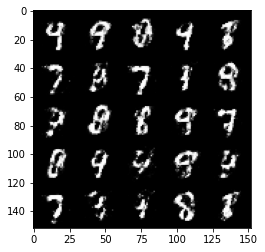

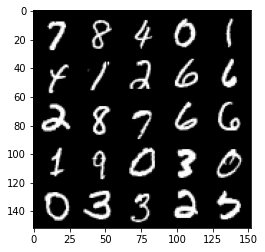

Step 41500: Generator loss: 2.0660018339157102, discriminator loss: 0.3231259982585905


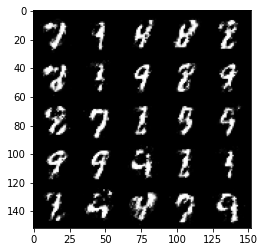

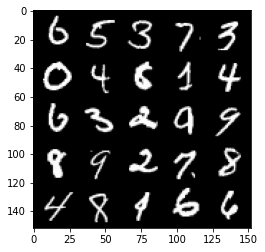

Step 42000: Generator loss: 2.1709642953872685, discriminator loss: 0.2779627378582956


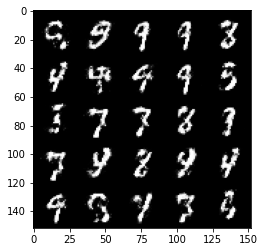

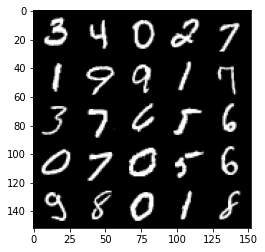

Step 42500: Generator loss: 2.2157411515712746, discriminator loss: 0.288116571933031


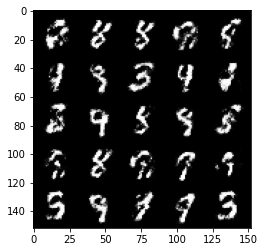

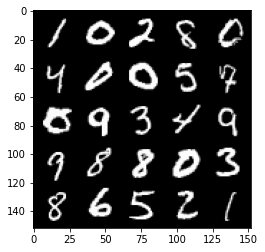

Step 43000: Generator loss: 2.1407665369510678, discriminator loss: 0.29837601360678645


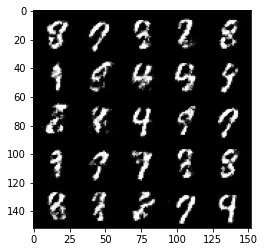

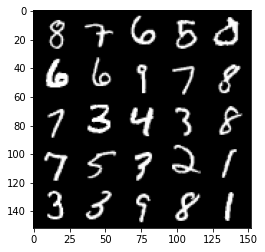

Step 43500: Generator loss: 2.0747976591587065, discriminator loss: 0.3088047469854354


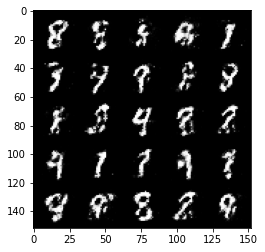

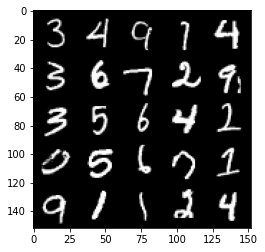

Step 44000: Generator loss: 2.1706281192302708, discriminator loss: 0.2884910376369957


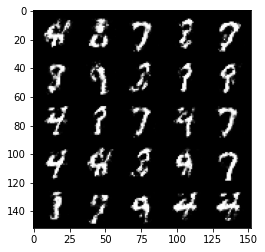

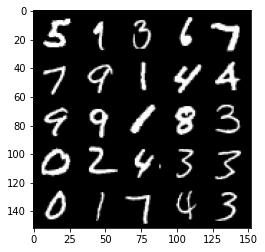

Step 44500: Generator loss: 2.1113899450302127, discriminator loss: 0.30188500490784664


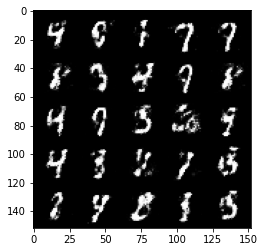

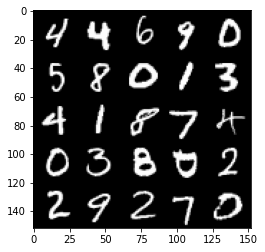

Step 45000: Generator loss: 2.079787539482118, discriminator loss: 0.3165649487078189


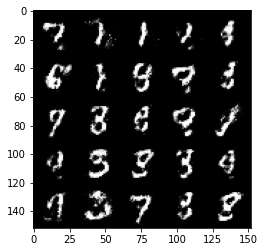

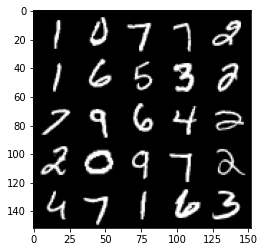

Step 45500: Generator loss: 2.031893718481065, discriminator loss: 0.32241923749446844


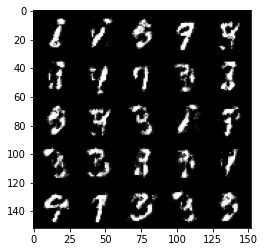

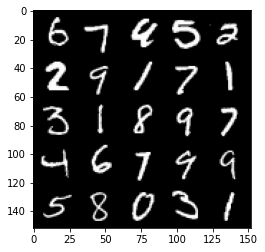

Step 46000: Generator loss: 2.0197199766635903, discriminator loss: 0.31150126814842216


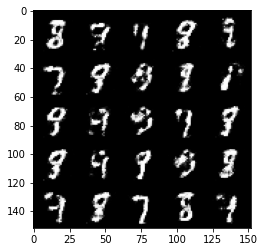

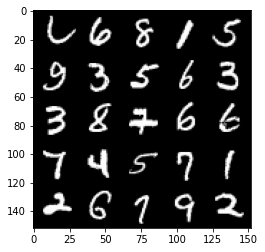

Step 46500: Generator loss: 2.0520309138298036, discriminator loss: 0.3217435346543791


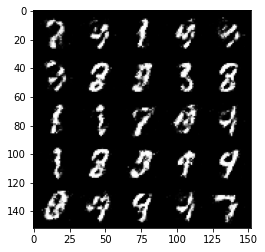

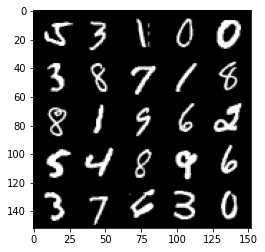

Step 47000: Generator loss: 1.9318425035476685, discriminator loss: 0.3489491056799889


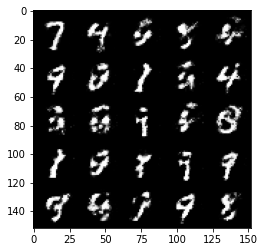

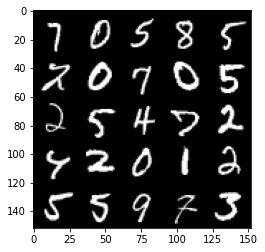

Step 47500: Generator loss: 1.9636208722591397, discriminator loss: 0.3296257107257839


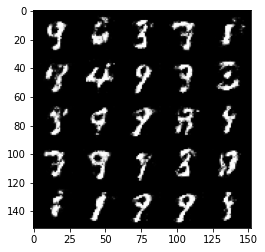

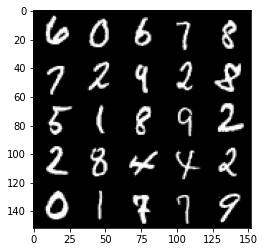

Step 48000: Generator loss: 2.0440013661384597, discriminator loss: 0.3194664357900617


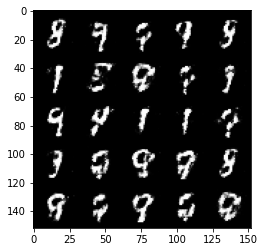

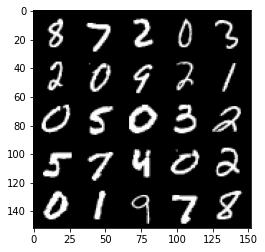

Step 48500: Generator loss: 2.047416803121567, discriminator loss: 0.3147861213088035


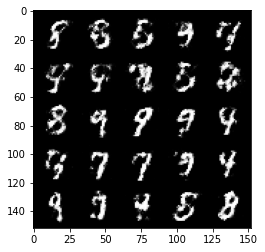

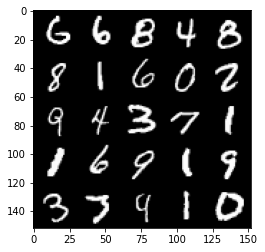

Step 49000: Generator loss: 1.9234037351608284, discriminator loss: 0.3408149496912952


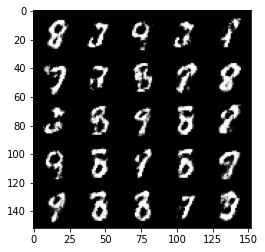

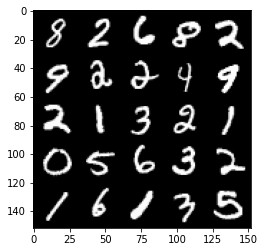

Step 49500: Generator loss: 2.0114684715270994, discriminator loss: 0.3082356399297718


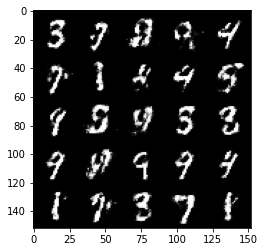

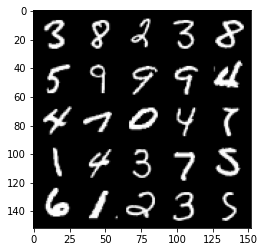

Step 50000: Generator loss: 2.0456714541912078, discriminator loss: 0.3150021598339075


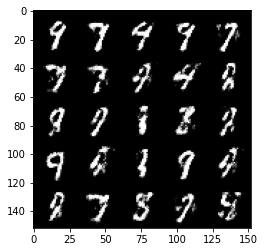

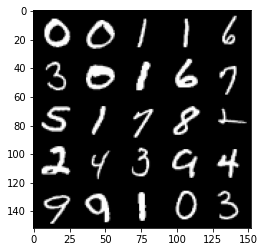

Step 50500: Generator loss: 2.0173602168560016, discriminator loss: 0.31782219928503036


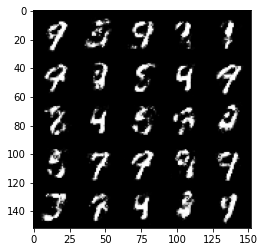

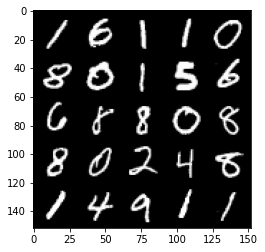

Step 51000: Generator loss: 2.0137409296035775, discriminator loss: 0.3209533981978889


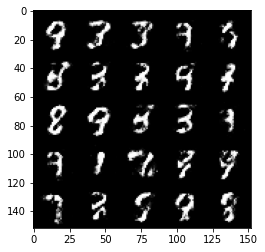

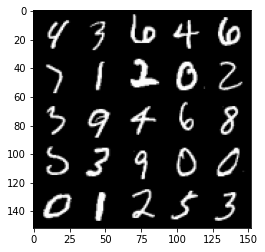

Step 51500: Generator loss: 1.9937697148323053, discriminator loss: 0.31017705863714223


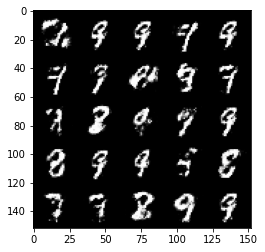

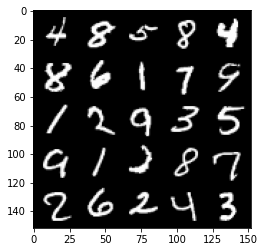

Step 52000: Generator loss: 1.9356124379634854, discriminator loss: 0.3248274728059767


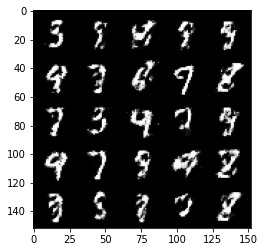

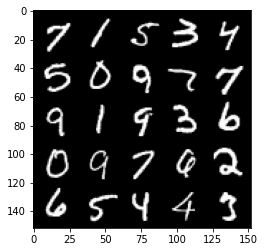

Step 52500: Generator loss: 2.0231549627780914, discriminator loss: 0.3160288111567496


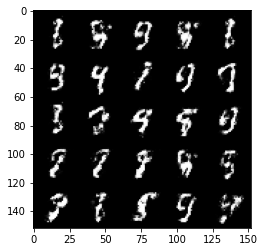

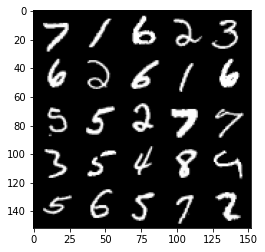

Step 53000: Generator loss: 1.790988023996353, discriminator loss: 0.37698517620563526


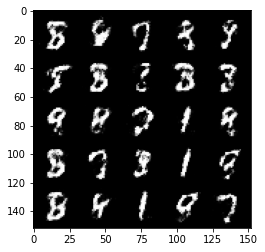

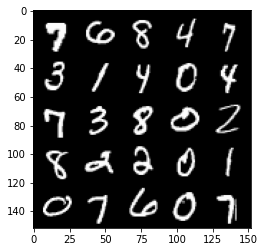

Step 53500: Generator loss: 1.754686951875688, discriminator loss: 0.371380060136318


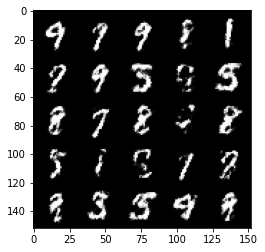

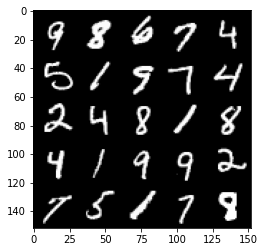

Step 54000: Generator loss: 1.7845800616741192, discriminator loss: 0.3626966993510725


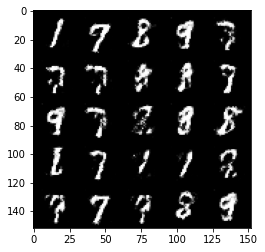

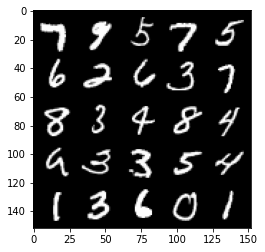

Step 54500: Generator loss: 1.7926192858219137, discriminator loss: 0.367996368318796


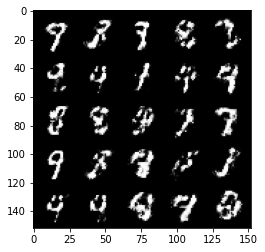

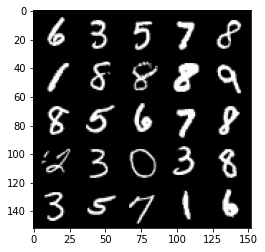

Step 55000: Generator loss: 1.863143483877184, discriminator loss: 0.3358091991543767


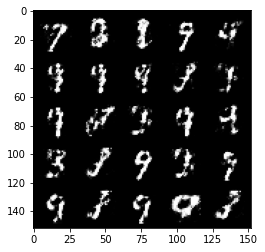

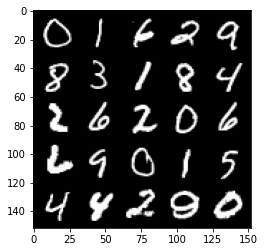

Step 55500: Generator loss: 1.9583462967872618, discriminator loss: 0.3247454745173453


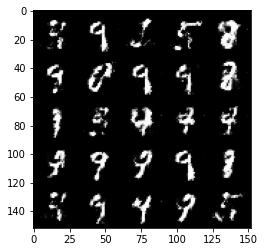

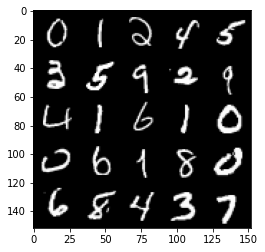

Step 56000: Generator loss: 1.9448818428516388, discriminator loss: 0.31531975913047805


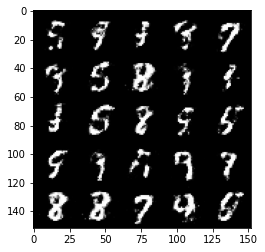

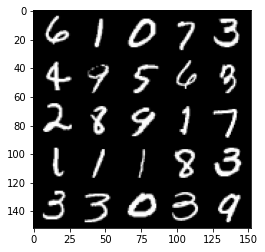

Step 56500: Generator loss: 2.051559189796447, discriminator loss: 0.32018387991189984


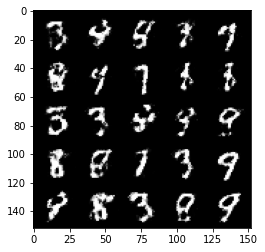

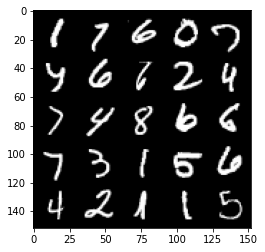

Step 57000: Generator loss: 1.8667185981273628, discriminator loss: 0.3596774316728114


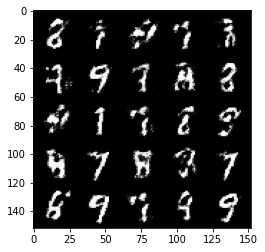

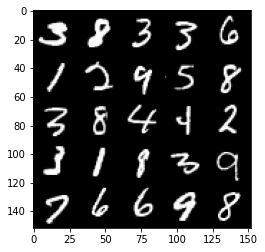

Step 57500: Generator loss: 1.8431131758689878, discriminator loss: 0.3678204549551012


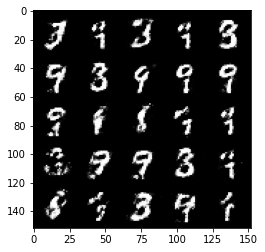

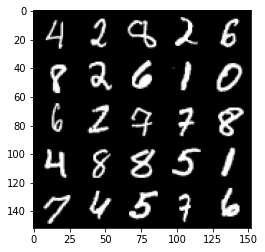

Step 58000: Generator loss: 1.871388171911238, discriminator loss: 0.344747622340918


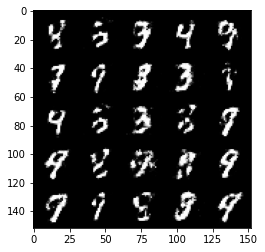

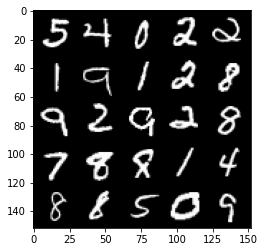

Step 58500: Generator loss: 1.9010811879634857, discriminator loss: 0.34294905689358707


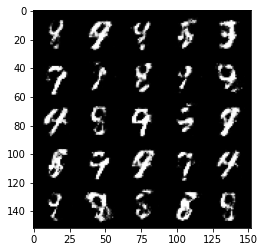

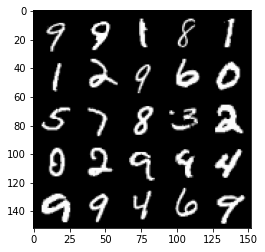

Step 59000: Generator loss: 1.8855774393081668, discriminator loss: 0.33529758641123764


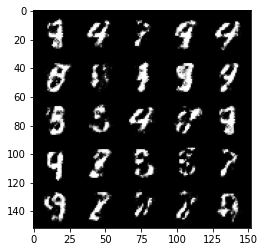

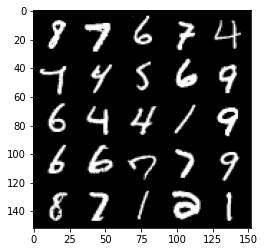

Step 59500: Generator loss: 1.8366020905971514, discriminator loss: 0.34223773172497735


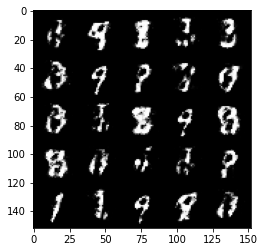

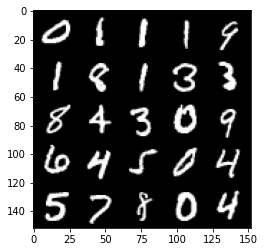

Step 60000: Generator loss: 1.8691824507713295, discriminator loss: 0.326432788968086


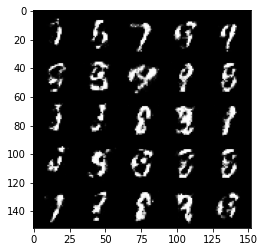

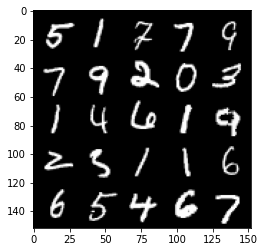

Step 60500: Generator loss: 1.886673332929612, discriminator loss: 0.34712317517399804


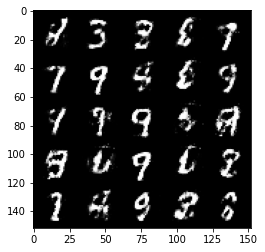

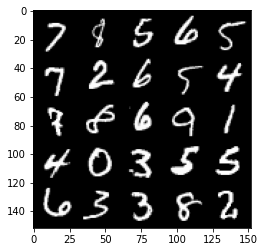

Step 61000: Generator loss: 1.8677306828498843, discriminator loss: 0.3451854664385316


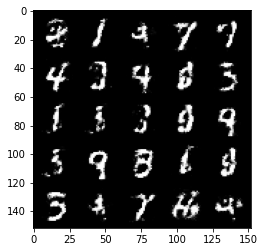

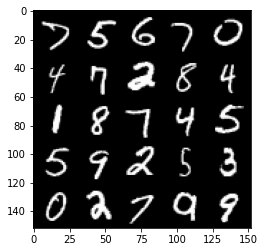

Step 61500: Generator loss: 1.8820513200759874, discriminator loss: 0.3435458741486075


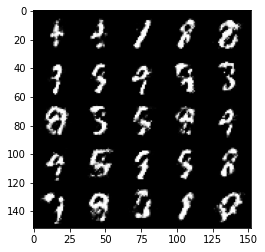

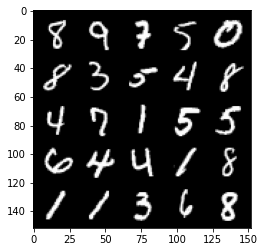

Step 62000: Generator loss: 1.8053276875019066, discriminator loss: 0.3674157031774521


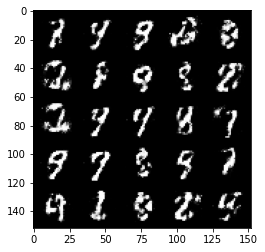

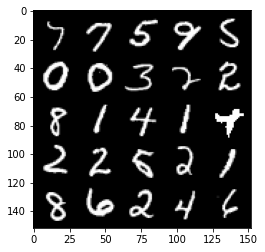

Step 62500: Generator loss: 1.8642816896438588, discriminator loss: 0.34568890064954766


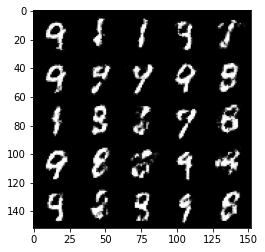

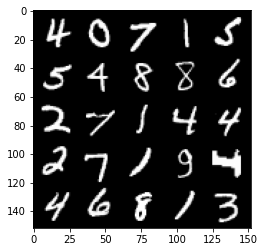

Step 63000: Generator loss: 1.7579376626014729, discriminator loss: 0.3825787743926053


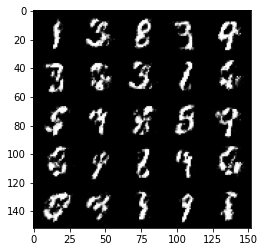

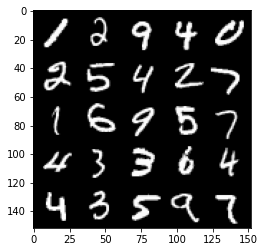

Step 63500: Generator loss: 1.770468429565429, discriminator loss: 0.37374912029504814


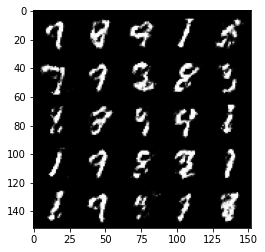

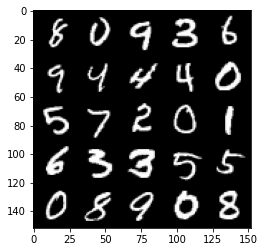

Step 64000: Generator loss: 1.7172671082019821, discriminator loss: 0.38474606281518875


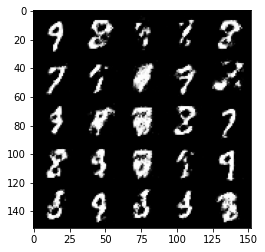

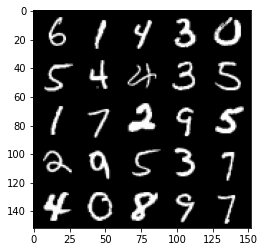

Step 64500: Generator loss: 1.5809414196014395, discriminator loss: 0.4183848630785941


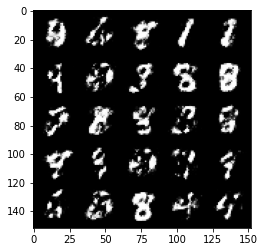

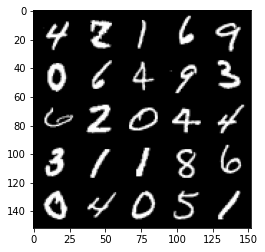

Step 65000: Generator loss: 1.6409386518001572, discriminator loss: 0.37898498278856274


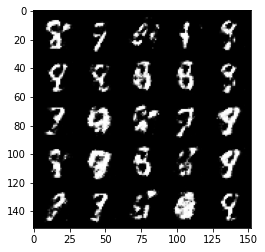

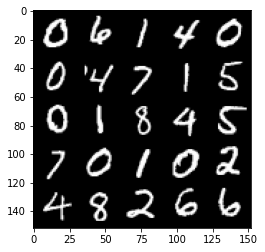

Step 65500: Generator loss: 1.6021967418193825, discriminator loss: 0.39346972864866286


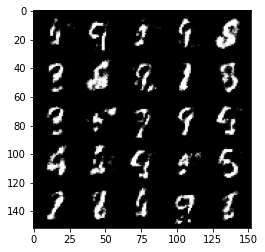

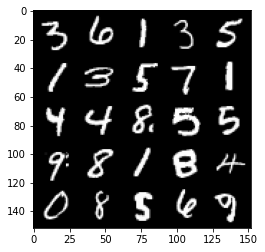

Step 66000: Generator loss: 1.663778902292252, discriminator loss: 0.3709198880791664


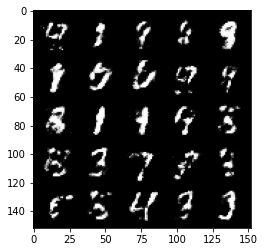

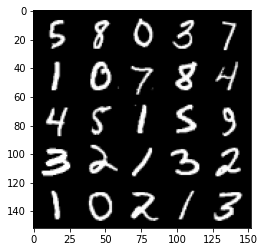

Step 66500: Generator loss: 1.5996063427925125, discriminator loss: 0.3986258949041366


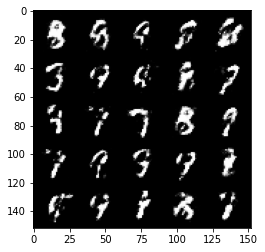

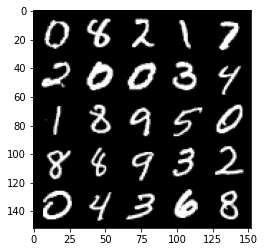

Step 67000: Generator loss: 1.570345965147017, discriminator loss: 0.42089553147554376


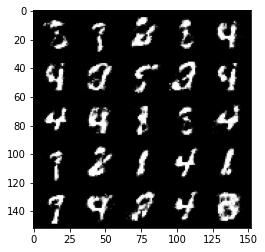

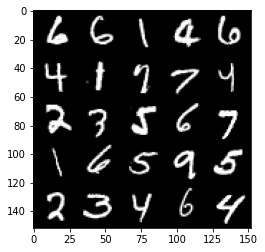

Step 67500: Generator loss: 1.573070836544037, discriminator loss: 0.4190378655195236


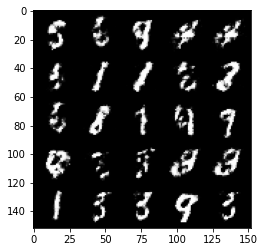

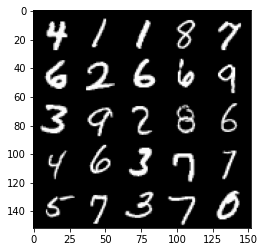

Step 68000: Generator loss: 1.5016450741291054, discriminator loss: 0.428140084981918


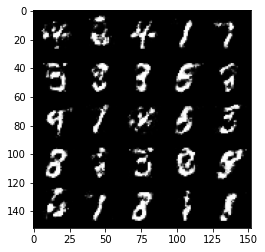

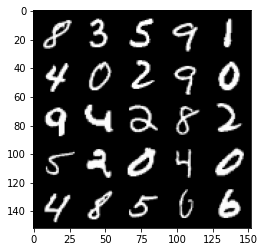

Step 68500: Generator loss: 1.5073836553096776, discriminator loss: 0.4336340342760086


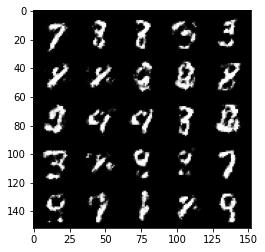

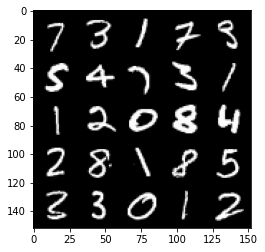

Step 69000: Generator loss: 1.5082117941379558, discriminator loss: 0.42704388129711124


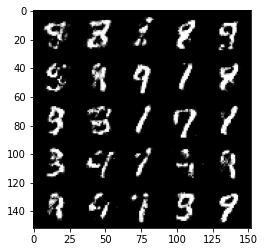

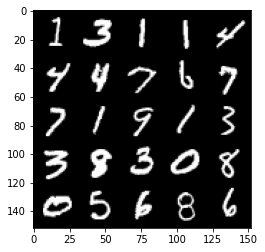

Step 69500: Generator loss: 1.5274489004611969, discriminator loss: 0.43566994273662546


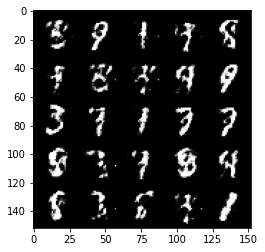

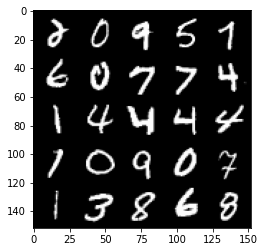

Step 70000: Generator loss: 1.5593826396465298, discriminator loss: 0.41415243881940894


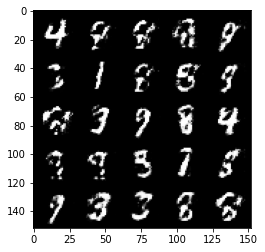

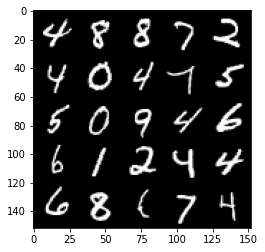

Step 70500: Generator loss: 1.5260368838310239, discriminator loss: 0.42291955548524857


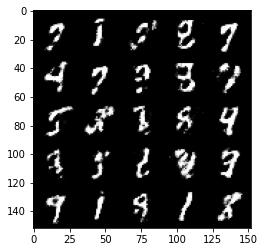

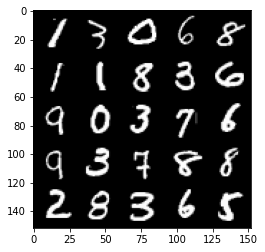

Step 71000: Generator loss: 1.5249777123928072, discriminator loss: 0.4276119694113731


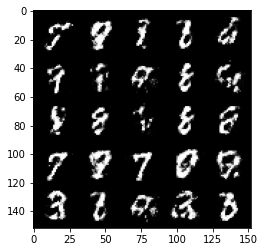

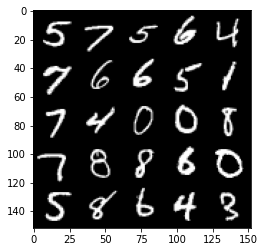

Step 71500: Generator loss: 1.4845874798297887, discriminator loss: 0.44648535811901063


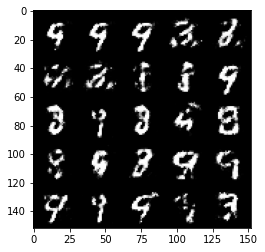

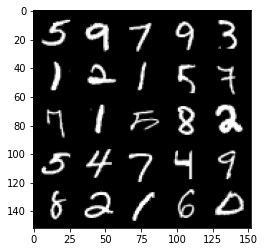

Step 72000: Generator loss: 1.375731190919876, discriminator loss: 0.46147922277450565


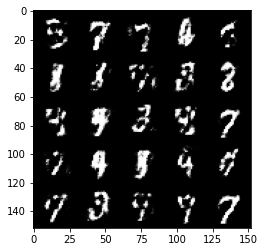

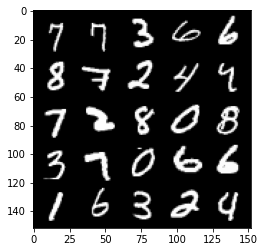

Step 72500: Generator loss: 1.4162892622947696, discriminator loss: 0.44437648719549167


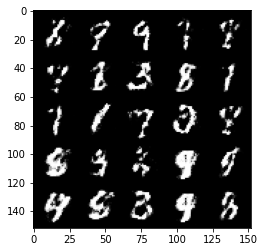

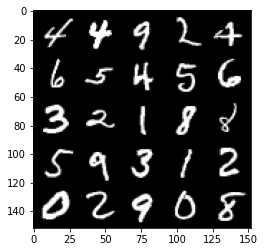

Step 73000: Generator loss: 1.411328130245208, discriminator loss: 0.4506596359610558


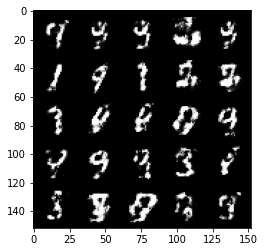

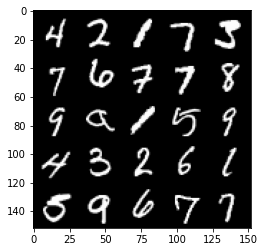

Step 73500: Generator loss: 1.3785496311187728, discriminator loss: 0.470136407971382


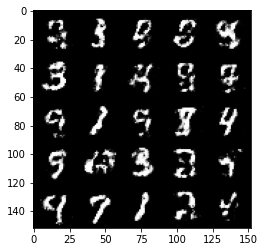

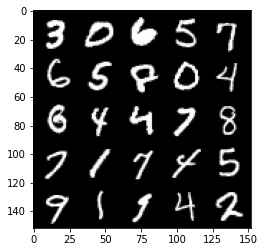

Step 74000: Generator loss: 1.3749783048629756, discriminator loss: 0.4550204468965528


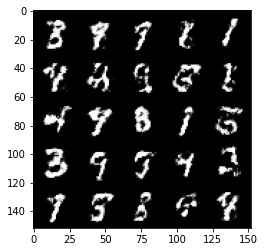

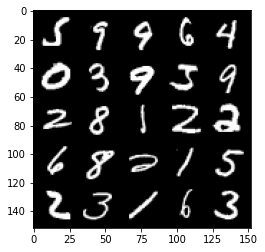

Step 74500: Generator loss: 1.4023130006790152, discriminator loss: 0.46125330924987823


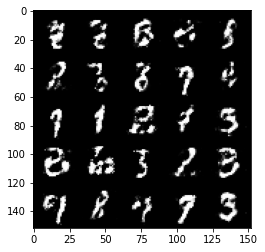

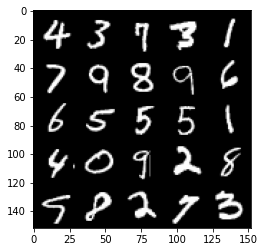

Step 75000: Generator loss: 1.3574049954414342, discriminator loss: 0.46530644863843923


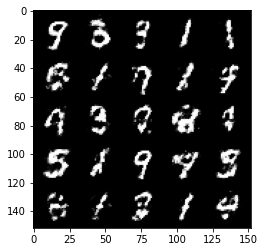

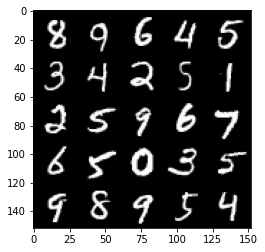

Step 75500: Generator loss: 1.418376819849016, discriminator loss: 0.4541717842817306


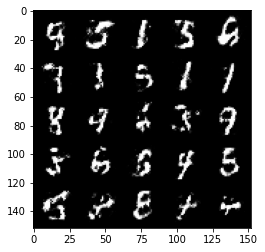

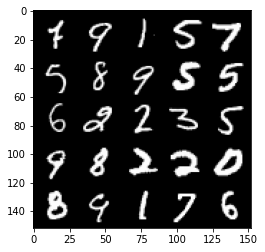

Step 76000: Generator loss: 1.4030290274620068, discriminator loss: 0.45675488197803493


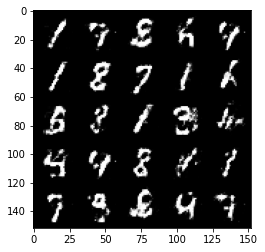

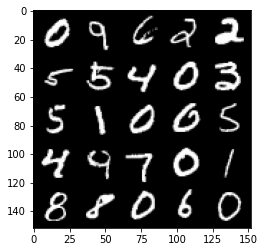

Step 76500: Generator loss: 1.327618461608888, discriminator loss: 0.48564447748661066


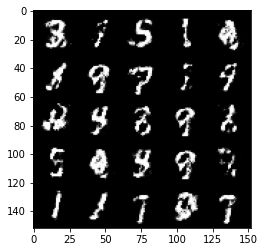

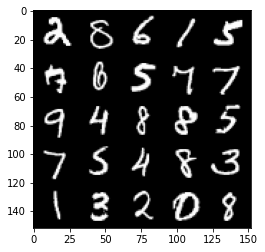

Step 77000: Generator loss: 1.347115818500518, discriminator loss: 0.4660516845583918


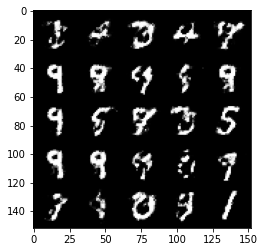

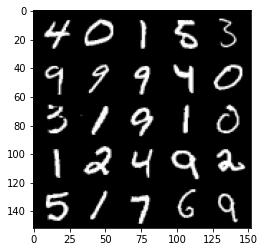

Step 77500: Generator loss: 1.3481433045864097, discriminator loss: 0.46800579261779784


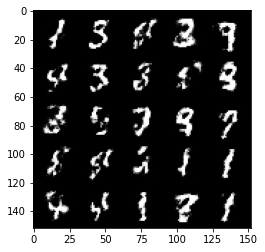

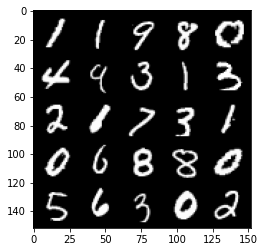

Step 78000: Generator loss: 1.3343537518978095, discriminator loss: 0.46878589493036243


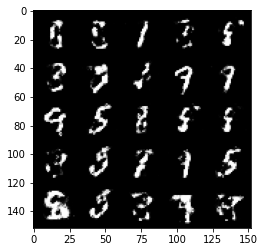

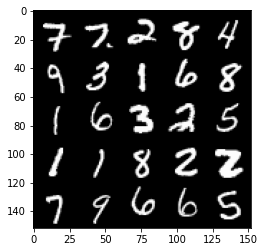

Step 78500: Generator loss: 1.3152292518615731, discriminator loss: 0.47541241228580483


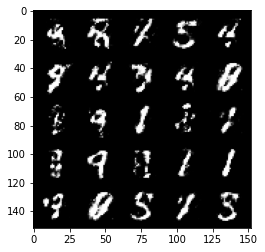

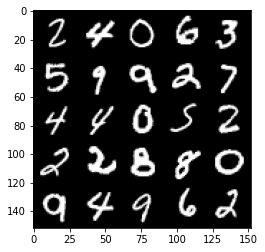

Step 79000: Generator loss: 1.3725286841392519, discriminator loss: 0.4556673421263695


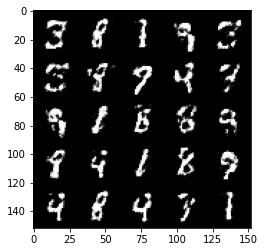

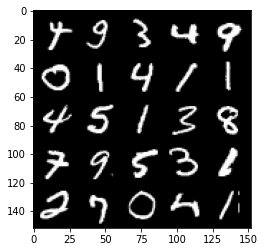

Step 79500: Generator loss: 1.428039637088776, discriminator loss: 0.4420346400141719


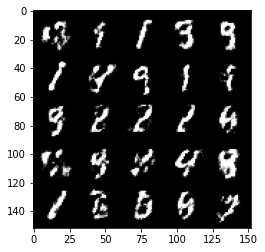

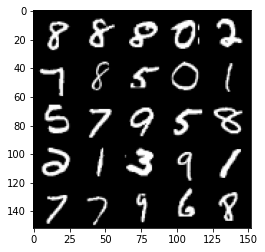

Step 80000: Generator loss: 1.3488367848396305, discriminator loss: 0.46926315581798517


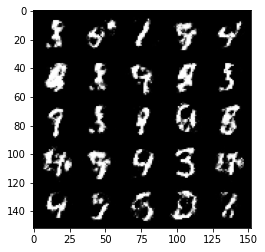

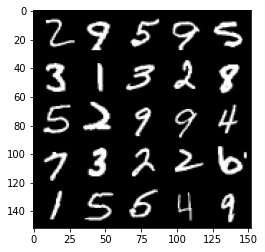

Step 80500: Generator loss: 1.3012903935909277, discriminator loss: 0.4800438182353972


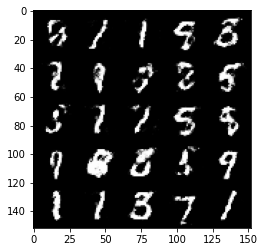

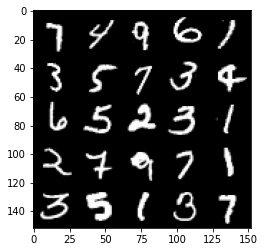

Step 81000: Generator loss: 1.3089598476886752, discriminator loss: 0.47353061044216144


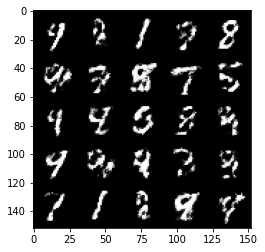

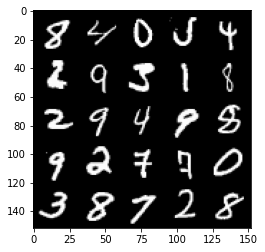

Step 81500: Generator loss: 1.2598642826080322, discriminator loss: 0.4906315141320228


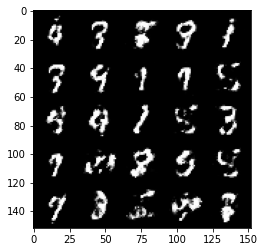

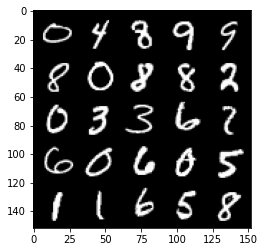

Step 82000: Generator loss: 1.2780175766944895, discriminator loss: 0.48935310548543925


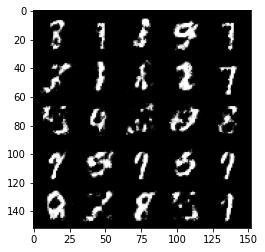

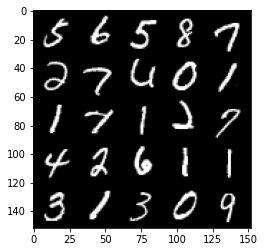

Step 82500: Generator loss: 1.2772276575565336, discriminator loss: 0.490734954535961


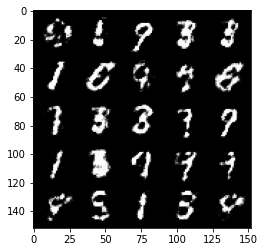

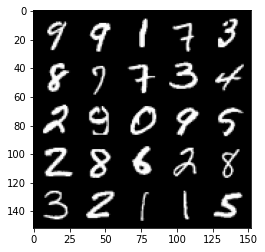

Step 83000: Generator loss: 1.2578223450183863, discriminator loss: 0.4934244235157966


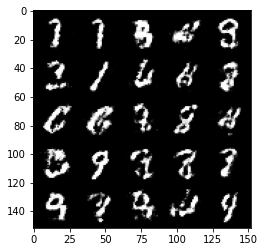

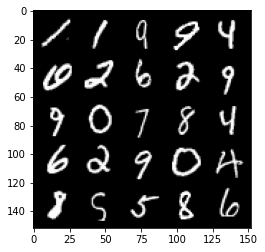

Step 83500: Generator loss: 1.2732088400125494, discriminator loss: 0.4853570542931553


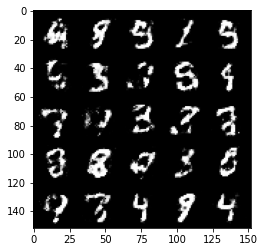

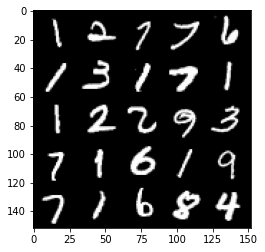

Step 84000: Generator loss: 1.188783898591996, discriminator loss: 0.5089124212861059


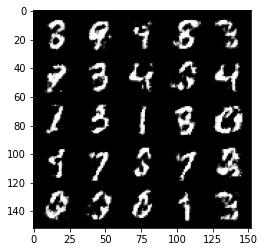

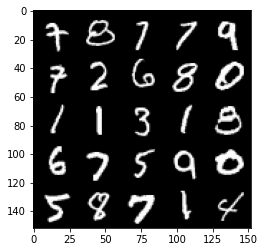

Step 84500: Generator loss: 1.1963964923620203, discriminator loss: 0.5232470999956126


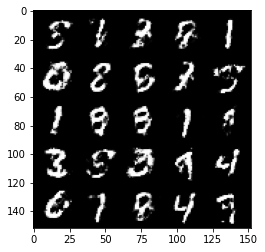

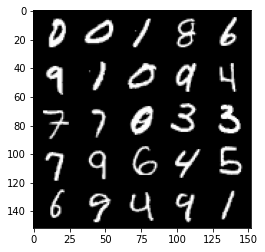

Step 85000: Generator loss: 1.2627209503650672, discriminator loss: 0.48179596233367905


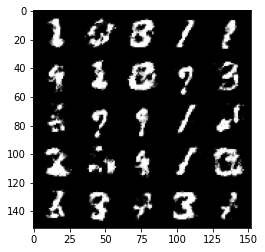

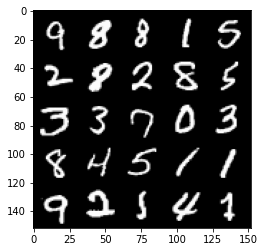

Step 85500: Generator loss: 1.2347989277839653, discriminator loss: 0.49854233044385904


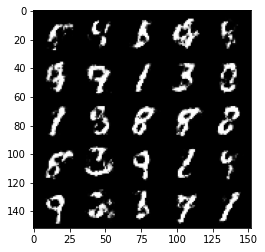

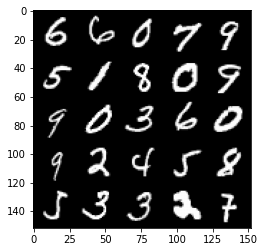

Step 86000: Generator loss: 1.2146424574851997, discriminator loss: 0.4952071250677105


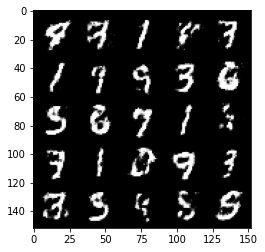

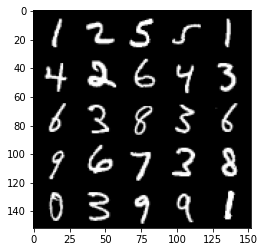

Step 86500: Generator loss: 1.1764213222265238, discriminator loss: 0.5153138234615325


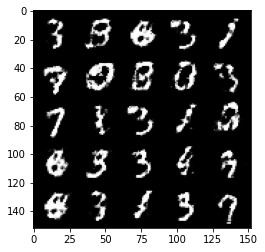

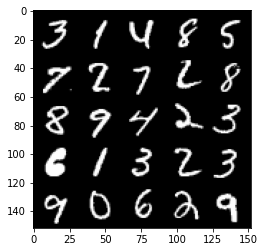

Step 87000: Generator loss: 1.1975254535675046, discriminator loss: 0.5072144292593004


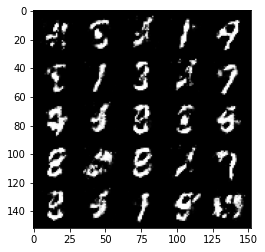

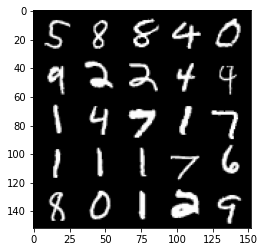

Step 87500: Generator loss: 1.2273520810604088, discriminator loss: 0.49575366938114146


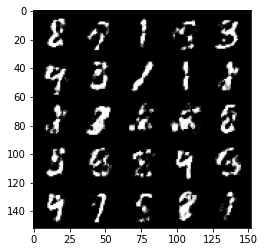

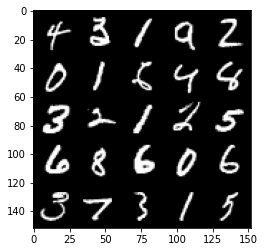

Step 88000: Generator loss: 1.2711976029872896, discriminator loss: 0.4832032488584521


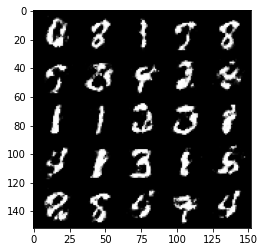

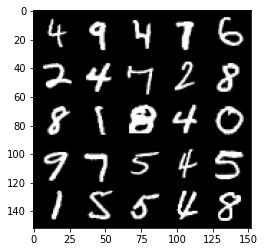

Step 88500: Generator loss: 1.2219575107097629, discriminator loss: 0.5160364828705787


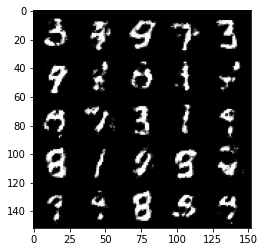

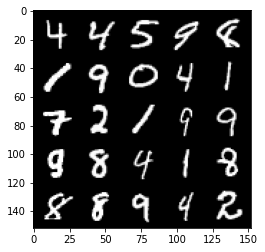

Step 89000: Generator loss: 1.235163293123246, discriminator loss: 0.4886321831941603


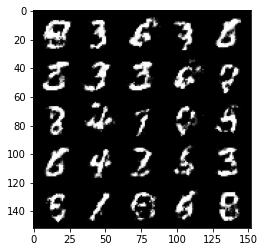

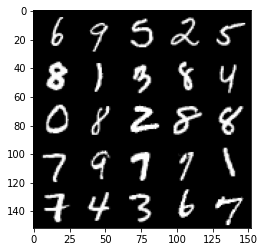

Step 89500: Generator loss: 1.2500193123817447, discriminator loss: 0.48594004923105266


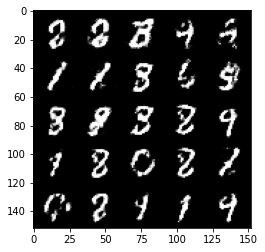

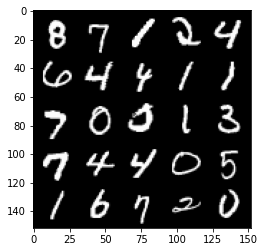

Step 90000: Generator loss: 1.3185154144763935, discriminator loss: 0.45905058670043947


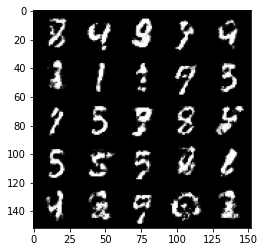

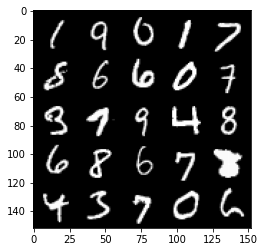

Step 90500: Generator loss: 1.2891071596145625, discriminator loss: 0.4720492081642146


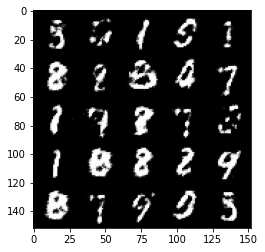

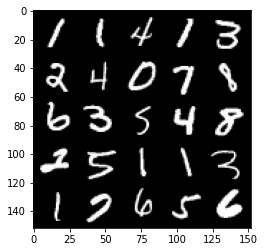

Step 91000: Generator loss: 1.2318924584388724, discriminator loss: 0.4976333451271054


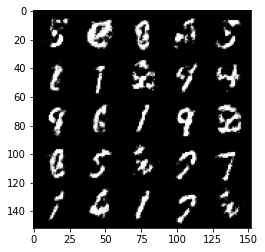

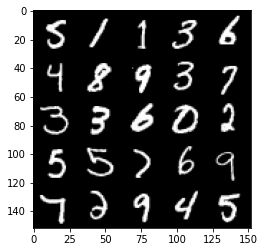

Step 91500: Generator loss: 1.1649476668834684, discriminator loss: 0.5136005308628085


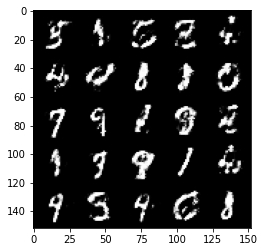

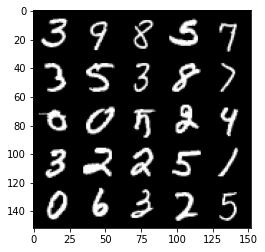

Step 92000: Generator loss: 1.201755119204521, discriminator loss: 0.512973070263863


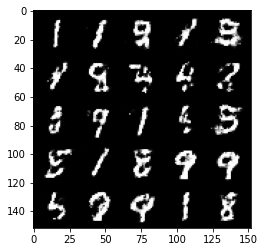

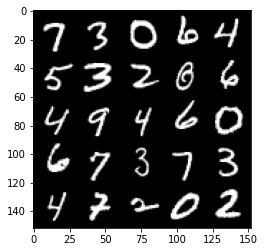

Step 92500: Generator loss: 1.1620521223545077, discriminator loss: 0.5226279501914973


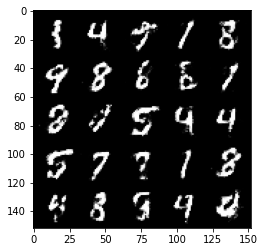

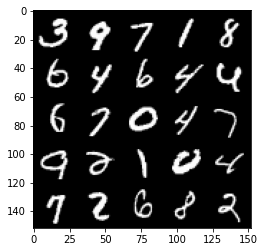

Step 93000: Generator loss: 1.2214562585353848, discriminator loss: 0.48978136575222025


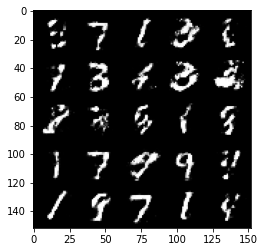

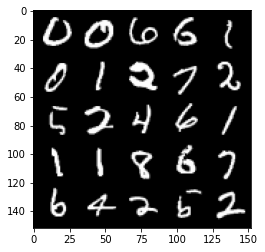

Step 93500: Generator loss: 1.1627222180366499, discriminator loss: 0.5169770171046254


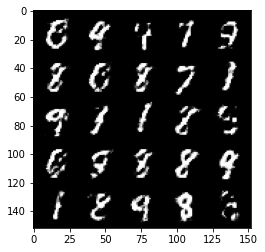

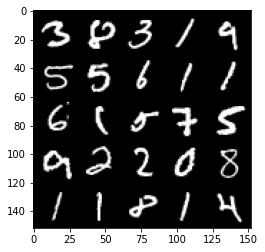

In [11]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
gen_loss = False
error = False

for epoch in range(n_epochs):
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        # Discriminator update
        disc_opt.zero_grad()
        disc_loss = get_disc_loss(gen, disc, loss_function, real, cur_batch_size, z_dim, device)
        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        # Generator update
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, loss_function, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()

        # Book keeping
        mean_discriminator_loss += disc_loss.item() / display_step
        mean_generator_loss += gen_loss.item() / display_step

        # Visualize current model output
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = create_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            plot_images_from_tensor(fake)
            plot_images_from_tensor(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1